In [2]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import altair as alt

In [14]:
df_liv = pd.read_csv('./live.csv', date_parser='timestamp')
df_ref = pd.read_csv('./reference.csv')

In [15]:
df_liv

,0,1,prediction,timestamp
0,11.393679,-12.517580,bag,03-09-2021 00:00:03.085497
1,10.602499,-12.165340,bag,03-09-2021 00:00:07.392757
2,2.161259,-0.241680,coat,03-09-2021 00:00:07.978729
3,9.252301,13.202354,trouser,03-09-2021 00:00:14.663417
4,-0.835732,-2.689010,shirt,03-09-2021 00:00:15.927015
...,...,...,...,...
43090,0.711305,12.965924,dress,07-09-2021 23:59:23.056818
43091,2.810259,-1.368679,coat,07-09-2021 23:59:25.011796
43092,15.594177,1.110968,sandal,07-09-2021 23:59:25.936525
43093,15.772076,0.294253,sandal,07-09-2021 23:59:51.321341


In [5]:
df_ref

,0,1,label
0,20.916310,0.640727,ankle boot
1,-6.172271,1.103996,t-shirt
2,-3.854040,3.751742,t-shirt
3,-0.786059,12.171598,dress
4,0.950913,6.594213,t-shirt
...,...,...,...
69995,21.153826,1.247363,ankle boot
69996,7.374936,14.902547,trouser
69997,10.584386,-12.098537,bag
69998,7.056801,16.044210,trouser


In [6]:
df_live['prediction'].unique()

NameError: name 'df_live' is not defined

<AxesSubplot: >

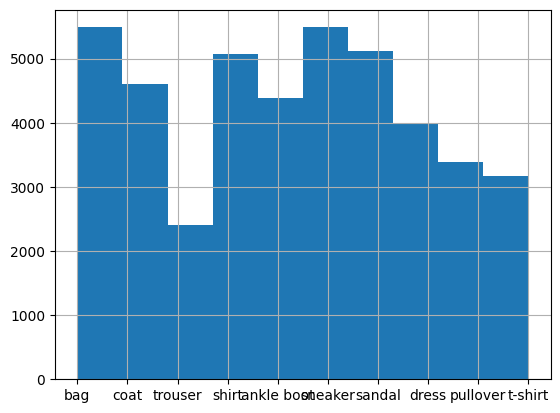

In [ ]:
df_liv['prediction'].hist()

<AxesSubplot: >

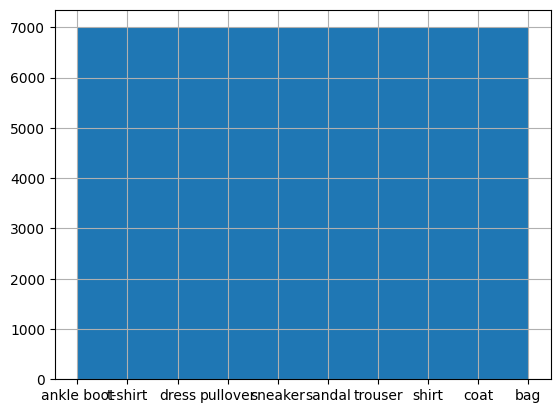

In [ ]:
df_ref['label'].hist()

In [7]:
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [8]:
alt.Chart(df_ref).mark_point().encode(
    x=alt.X('0', title=''),
    y=alt.Y('1', title=''),
    color='label:N'
)

alt.Chart(...)

In [9]:
alt.Chart(df_liv).mark_point().encode(
    x=alt.X('0', title='', bin=True),
    y=alt.Y('1', title='', bin=True),
    color='prediction:N',
    size='count()'
)

alt.Chart(...)

In [10]:
chart = alt.Chart(df_ref).mark_circle().encode(
    x=alt.X('0', bin=alt.Bin(maxbins=30)),
    y=alt.Y('1', bin=alt.Bin(maxbins=30)),
    color=alt.Color(
        'label:N', 
        scale=alt.Scale(scheme='category10'), 
        legend=None,
    ),
    opacity=alt.Size('count():Q'),
    size=alt.Size('count():Q')
)
chart

alt.Chart(...)

In [13]:
df_liv

,0,1,prediction,timestamp
0,11.393679,-12.517580,bag,03-09-2021 00:00:03.085497
1,10.602499,-12.165340,bag,03-09-2021 00:00:07.392757
2,2.161259,-0.241680,coat,03-09-2021 00:00:07.978729
3,9.252301,13.202354,trouser,03-09-2021 00:00:14.663417
4,-0.835732,-2.689010,shirt,03-09-2021 00:00:15.927015
...,...,...,...,...
43090,0.711305,12.965924,dress,07-09-2021 23:59:23.056818
43091,2.810259,-1.368679,coat,07-09-2021 23:59:25.011796
43092,15.594177,1.110968,sandal,07-09-2021 23:59:25.936525
43093,15.772076,0.294253,sandal,07-09-2021 23:59:51.321341


In [49]:
alt.Chart(df_liv).mark_circle().encode(
    x=alt.X('hours(timestamp):O'),
    y=alt.Y('prediction:N', ),
    color=alt.Color(
        'prediction:N', 
        scale=alt.Scale(scheme='category10'), 
        legend=None,
    ),
    size=alt.Size('count():Q'),
    facet=alt.Facet('day(timestamp):O', columns=2),
)

alt.Chart(...)